# I choose to use classification because the dataset only had images so it would better to choose it as a classificatio problem. However, Object detection could also be done if I had annotations in a form of text or csv file done for the images. So for this kind of data objection detections are not possible.  

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Extracting Data from Zip

In [ ]:
# !unzip "/content/disease.zip" -d "/content/"
# !unzip "/content/no-disease.zip" -d "/content/"
!unzip "/content/drive/MyDrive/animals.zip" -d "/content/animals/"

Archive:  /content/drive/MyDrive/animals.zip
   creating: /content/animals/antelope/
  inflating: /content/animals/antelope/02f4b3be2d.jpg  
  inflating: /content/animals/antelope/03d7fc0888.jpg  
  inflating: /content/animals/antelope/058fa9a60f.jpg  
  inflating: /content/animals/antelope/0a37838e99.jpg  
  inflating: /content/animals/antelope/0b1a3af197.jpg  
  inflating: /content/animals/antelope/0b688923b0.jpg  
  inflating: /content/animals/antelope/0c16ef86c0.jpg  
  inflating: /content/animals/antelope/0e17715606.jpg  
  inflating: /content/animals/antelope/0ee903ea13.jpg  
  inflating: /content/animals/antelope/0fb2e9aa81.jpg  
  inflating: /content/animals/antelope/0fe7076f06.jpg  
  inflating: /content/animals/antelope/17a07512e9.jpg  
  inflating: /content/animals/antelope/17ddf07f85.jpg  
  inflating: /content/animals/antelope/1a3f59ee02.jpg  
  inflating: /content/animals/antelope/1b0b0b614b.jpg  
  inflating: /content/animals/antelope/1d3c6105c9.jpg  
  inflating: /conte

#Importing Libraries

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import to_categorical
from keras.preprocessing import image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras import models
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import os
from PIL import Image
%matplotlib inline

# example of a cnn for image classification
from numpy import asarray
from numpy import unique
from numpy import argmax
from tensorflow.keras.datasets.mnist import load_data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import tensorflow as tf

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPool2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout

from sklearn.model_selection import train_test_split
from google.colab import files
from sklearn.metrics import mean_squared_error

import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg16 import VGG16
from keras import Model, layers

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import itertools

from sklearn.model_selection import KFold

#Preprocessing Data to create images array in a form of numpy array

In [ ]:
train_image = []
def create_dataset_PIL(img_folder):

    img_data_array=[]
    class_name=[]
    for dir1 in os.listdir(img_folder):
        for file in os.listdir(os.path.join(img_folder, dir1)):
            image_path= os.path.join(img_folder, dir1,  file)
            # img_read=Image.open(image_path)
            img = image.load_img(str(image_path),target_size=(256,256,3))
            img = image.img_to_array(img)
            img = img/255
            train_image.append(img)
            class_name.append(dir1)
    return train_image , class_name



In [ ]:
img_folder=r'/content/animals'
PIL_img_data, class_name=create_dataset_PIL(img_folder)


#Dictionary to assign numeric value to each class

In [ ]:
target_dict={k: v for v, k in enumerate(np.unique(class_name))}
print(target_dict)
target_val=  [target_dict[class_name[i]] for i in range(len(class_name))]
n_classes=len(target_dict)
# print(target_val)

{'antelope': 0, 'badger': 1, 'bat': 2, 'bear': 3, 'bee': 4, 'beetle': 5, 'bison': 6, 'boar': 7, 'butterfly': 8, 'cat': 9, 'caterpillar': 10, 'chimpanzee': 11, 'cockroach': 12, 'cow': 13, 'coyote': 14, 'crab': 15, 'crow': 16, 'deer': 17, 'dog': 18, 'dolphin': 19}


In [ ]:
n_classes

20

In [ ]:
PIL_img_data[0].shape

(256, 256, 3)

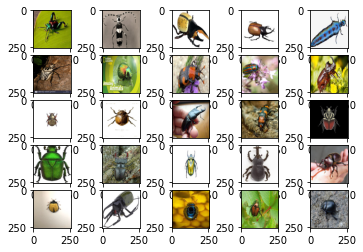

In [ ]:
from matplotlib import pyplot
for i in range(25):
     # define subplot
     pyplot.subplot(5, 5, i+1)
     # plot raw pixel data
     pyplot.imshow(PIL_img_data[i], cmap=pyplot.get_cmap('gray'))
 # show the figure
pyplot.show()

#Splitting data into Train, Validation and Test. 2% for Test, 20% for Validation and remaining for Train

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(np.array(PIL_img_data), np.array(target_val), test_size=0.02)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2)


In [ ]:
X_train.shape

(940, 256, 256, 3)

# The Following commented NNs were tested. I am keeping the code there, However, I used VGG which was relatively better.

In [ ]:
# model = Sequential()
# model.add(Conv2D(filters=16, kernel_size=(2, 2), activation="relu", input_shape=(256, 256,3)))
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.25))
# model.add(Conv2D(filters=32, kernel_size=(5, 5), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.25))
# model.add(Conv2D(filters=64, kernel_size=(5, 5), activation="relu"))
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.25))
# model.add(Conv2D(filters=64, kernel_size=(5, 5), activation='relu'))
# model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.25))
# model.add(Flatten())
# model.add(Dense(128, activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(64, activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(20, activation='sigmoid'))
# # model.add(Dense(128, activation='relu'))
# # model.add(Dropout(0.5))
# # model.add(Dense(64, activation='relu'))
# # # model.add(Dropout(0.5))
# # model.add(Dense(20, activation='sigmoid'))
# # model.add(Dropout(0.5))
# # model.add(Dense(20, activation='softmax'))

In [ ]:
# from keras.layers.core import Dense, Dropout, Activation, Flatten
# from keras.layers.convolutional import Convolution2D, MaxPooling2D
# # from keras.optimizers import Adam, SGD
# import matplotlib.pyplot as plt

# from tensorflow.keras.datasets import mnist
# from tensorflow.keras.models import Sequential
# from keras.layers.core import Dense, Dropout, Activation, Flatten
# from tensorflow.keras.layers import Conv2D,MaxPool2D
# # from keras.layers.convolutional import Convolution2D, MaxPooling2D
# from keras.utils import np_utils
# from keras.utils import np_utils, generic_utils
# from tensorflow.keras.optimizers import Adam, SGD

# import tensorflow.keras.backend as K

# model = Sequential()

# model.add(Conv2D(filters=16, kernel_size=(2, 2), activation="relu", input_shape=(256, 256,3)))
# # model.add(Conv2D(32, kernel_size=(3, 3),input_shape=input_shape))
# model.add(Activation('relu'))
# model.add(MaxPool2D(pool_size=(2, 2)))

# model.add(Conv2D(32, (3, 3)))
# model.add(Activation('relu'))
# model.add(MaxPool2D(pool_size=(2, 2)))

# model.add(Conv2D(64, (3, 3)))
# model.add(Activation('relu'))
# model.add(MaxPool2D(pool_size=(2, 2)))

# model.add(Conv2D(64, (2, 2)))
# model.add(Activation('relu'))
# model.add(MaxPool2D(pool_size=(1, 1)))

# model.add(Flatten())
# model.add(Dense(256))
# model.add(Activation('relu'))

# model.add(Dense(20))
# model.add(Activation('softmax'))

In [ ]:
# model.summary()

In [ ]:
# model.compile(optimizer='adam',loss = tf.keras.losses.CategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

# opt = SGD(lr=0.01, momentum=0.9)
# model.compile(loss='categorical_crossentropy', optimizer="adam", metrics=['accuracy'])
# model.compile(loss = "binary_crossentropy", optimizer=Adam(learning_rate = 0.001))
# model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
# #random architecture
# benchmark_model = Sequential()
# # Input here is 4D array (batchsize, height, width, channels) - we have already created the train_generator with batch size 32
# # 32 Images of size each 150x150 with 3 color channels will be input into this layer
# benchmark_model.add(Conv2D(128, kernel_size=7, activation='relu', input_shape=(150,150,3)))
# benchmark_model.add(MaxPooling2D(pool_size=(4,4), strides=(2,2)))
# benchmark_model.add(Conv2D(64, kernel_size=5, activation='relu'))
# benchmark_model.add(MaxPooling2D(pool_size=(4,4), strides=(2,2)))
# benchmark_model.add(Flatten())
# benchmark_model.add(Dense(128,activation='relu'))
# benchmark_model.add(Dense(20,activation='softmax'))
# benchmark_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['acc'])
# benchmark_model.summary()

#VGG16 initialized and Trained

In [ ]:
vgg16_model = VGG16(pooling='avg', weights='imagenet', include_top=False, input_shape=(256,256,3))
for layers in vgg16_model.layers:
            layers.trainable=False
last_output = vgg16_model.layers[-1].output
vgg_x = Flatten()(last_output)
vgg_x = Dense(128, activation = 'relu')(vgg_x)
vgg_x = Dense(20, activation = 'softmax')(vgg_x)
vgg16_final_model = Model(vgg16_model.input, vgg_x)
vgg16_final_model.compile(loss = 'sparse_categorical_crossentropy', optimizer= 'adam', metrics=['acc'])

# VGG16
# number_of_epochs = vgg_epoch
vgg16_filepath = 'vgg_16_'+'-saved-model-{epoch:02d}-acc-{val_acc:.2f}.hdf5'
vgg_checkpoint = tf.keras.callbacks.ModelCheckpoint(vgg16_filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
vgg_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)
vgg16_history = vgg16_final_model.fit(X_train, y_train, epochs=40, validation_data=(X_val, y_val), batch_size=128)


58900480/58889256 [==============================] - 0s 0us/step
Epoch 1/40
8/8 [==============================] - 44s 3s/step - loss: 3.0252 - acc: 0.0553 - val_loss: 2.9498 - val_acc: 0.0975
Epoch 2/40
8/8 [==============================] - 7s 908ms/step - loss: 2.8850 - acc: 0.1702 - val_loss: 2.8531 - val_acc: 0.1737
Epoch 3/40
8/8 [==============================] - 7s 909ms/step - loss: 2.7746 - acc: 0.2617 - val_loss: 2.7443 - val_acc: 0.3093
Epoch 4/40
8/8 [==============================] - 7s 917ms/step - loss: 2.6692 - acc: 0.3500 - val_loss: 2.6707 - val_acc: 0.3178
Epoch 5/40
8/8 [==============================] - 7s 925ms/step - loss: 2.5592 - acc: 0.4266 - val_loss: 2.5676 - val_acc: 0.3898
Epoch 6/40
8/8 [==============================] - 7s 935ms/step - loss: 2.4595 - acc: 0.4266 - val_loss: 2.4802 - val_acc: 0.3941
Epoch 7/40
8/8 [==============================] - 7s 939ms/step - loss: 2.3541 - acc: 0.5149 - val_loss: 2.4017 - val_acc: 0.4364
Epoch 8/40
8/8 [===========

In [ ]:
predictions = vgg16_final_model.predict(X_val)
vgg16_final_model.evaluate(X_val, y_val)

8/8 [==============================] - 1s 170ms/step - loss: 1.1628 - acc: 0.6653


[1.1627514362335205, 0.6652542352676392]

#Following command save the model to the current directory

In [ ]:
!mkdir -p saved_model
vgg16_final_model.save('saved_model/my_model')

INFO:tensorflow:Assets written to: saved_model/my_model/assets


#Loads the saved model

In [ ]:
model = tf.keras.models.load_model('saved_model/my_model')

# Check its architecture
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

#Dowmloads the model

In [ ]:
files.download('/content/saved_model')

#Prediction on Test sample at location 5

In [ ]:
proba = model.predict(X_test[5].reshape(1,256,256,3))
top_3 = np.argsort(proba[0])[:-6:-1]
pred = []
imgList = []

print(top_3,proba)


[12  5 10  4  2] [[2.0885092e-04 1.2611206e-06 7.0914056e-04 7.0161775e-08 1.2342128e-03
  1.1433299e-02 1.9552604e-07 7.3685165e-08 3.8655539e-04 6.6669195e-06
  2.6849220e-03 5.6356571e-06 9.8261434e-01 2.3965024e-06 1.0137018e-05
  3.2208450e-04 1.7910912e-04 4.9664763e-05 1.2060781e-07 1.5137460e-04]]


In [ ]:
layer_outputs = [layer.output for layer in model.layers[:12]]
# Extracts the outputs of the top 12 layers
activation_model = models.Model(inputs=model.input, outputs=layer_outputs) # Creates a model that will return these outputs, given the model input

In [ ]:
activations = activation_model.predict(X_test[5].reshape(1,256,256,3))
# Returns a list of five Numpy arrays: one array per layer activation

In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 256, 256, 3)


#Display features at layers

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


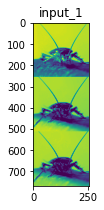

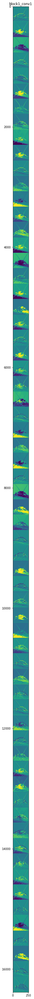

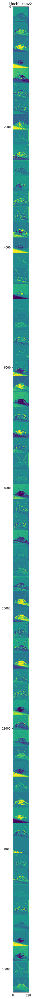

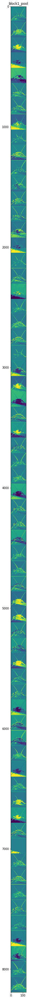

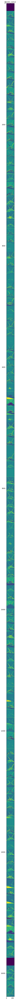

...

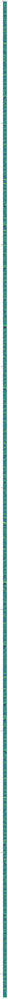

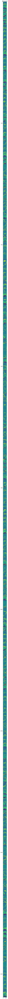

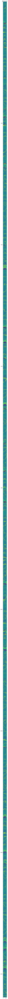

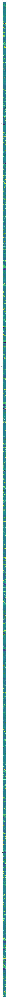

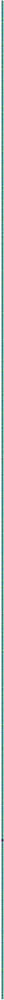

In [ ]:
layer_names = []
for layer in model.layers[:12]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot

images_per_row = 1

for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

#Inference on Test Data

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


Total Accuracy:  83.29166666666667
{'antelope': 0, 'badger': 1, 'bat': 2, 'bear': 3, 'bee': 4, 'beetle': 5, 'bison': 6, 'boar': 7, 'butterfly': 8, 'cat': 9, 'caterpillar': 10, 'chimpanzee': 11, 'cockroach': 12, 'cow': 13, 'coyote': 14, 'crab': 15, 'crow': 16, 'deer': 17, 'dog': 18, 'dolphin': 19}


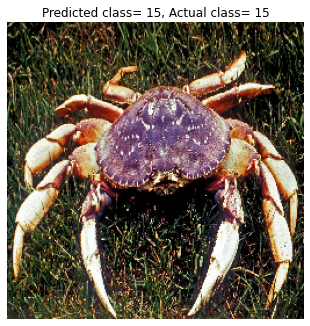

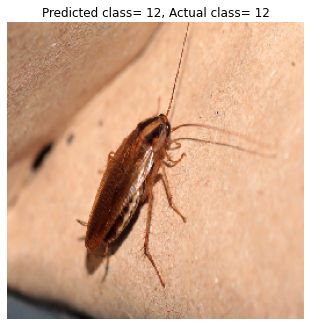

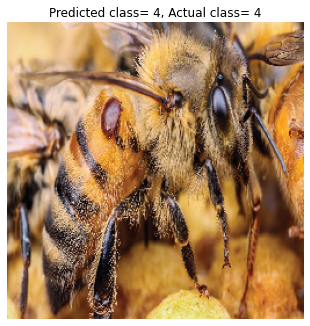

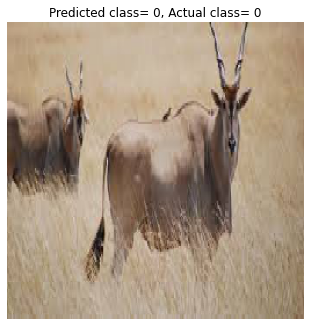

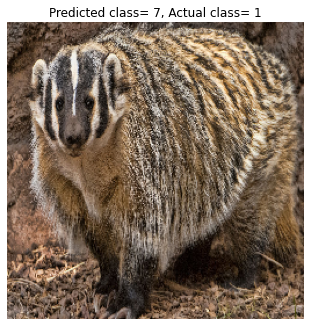

...

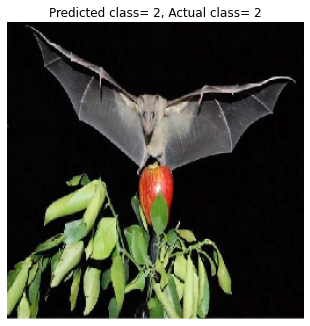

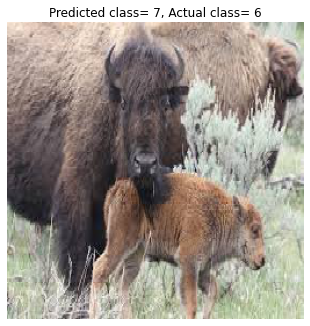

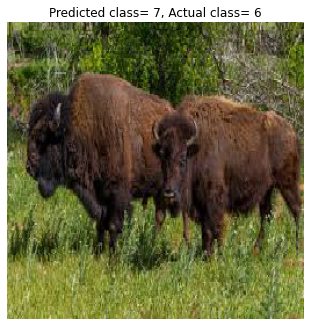

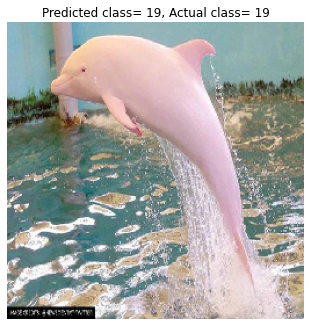

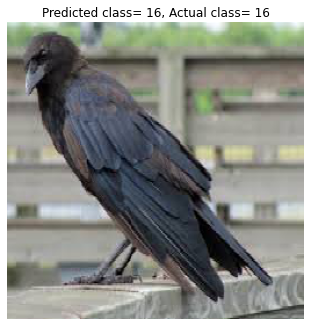

In [ ]:
pred = []
imgList = []
j=0
loss=0
for i in X_test:

    yhat = vgg16_final_model.predict(asarray([i]))
    top_3 = np.argsort(proba[0])[:-6:-1]
  # create figure
    fig = plt.figure(figsize=(15, 12))
    rows = 2
    columns = 2

    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, 1)
    plt.imshow(i)

    # plt.title(label="Predicted class= " +str(list(target_dict.keys())[list(target_dict.values()).index(argmax(yhat))])+", Actual class= "+str(list(target_dict.keys())[list(target_dict.values()).index(argmax(y_test[j]))]))
    plt.title(label="Predicted class= " +str(argmax(yhat))+", Actual class= "+str(y_test[j]))
    plt.axis('off')

    # #print("{}".format(classes[top_3[0]]))

    pred.append(argmax(yhat))
    # print('Predicted: class=%d' % argmax(yhat),'Actual: class=', y_test[j])
    j=j+1

Accuracy=100-mean_squared_error(y_test,pred)
print("Total Accuracy: ",Accuracy)
print(target_dict)

# Other Evaluation Metrics i.e. precision, recall, F1 score, Confusion Matrix. For this case there might be class imbalance issue as the data for each class are not same so F1 score should help in evaluating model's performance.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1

              precision    recall  f1-score   support

           0       1.00      0.50      0.67         2
           1       0.00      0.00      0.00         1
           2       1.00      1.00      1.00         1
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00         1
           6       1.00      0.33      0.50         3
           7       0.00      0.00      0.00         0
           8       1.00      1.00      1.00         1
          12       1.00      0.67      0.80         3
          13       1.00      1.00      1.00         1
          14       1.00      0.33      0.50         3
          15       0.67      1.00      0.80         2
          16       1.00      1.00      1.00         1
          17       0.50      1.00      0.67         1
          18       0.00      0.00      0.00         0
          19       1.00      1.00      1.00         1

    accuracy                           0.71        24
   macro avg       0.76   

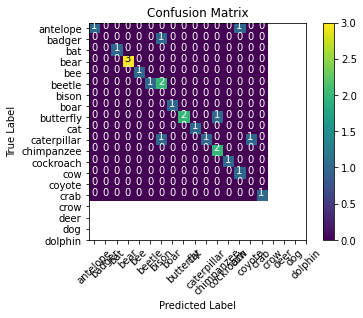

In [ ]:
cm = confusion_matrix(y_test,pred)
plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(target_dict))
plt.xticks(tick_marks, target_dict, rotation=45)
plt.yticks(tick_marks, target_dict)
thresh = cm.max()*0.8
for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
    # print(i,j)
    plt.text(j,i,cm[i,j],
            horizontalalignment="center",
            color="black" if cm[i,j] > thresh else "white")


plt.ylabel('True Label')
plt.xlabel('Predicted Label')
print(classification_report(y_test, pred))

#Cross Validation using Kfold with K as 4

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(np.array(PIL_img_data), np.array(target_val), test_size=0.02)

# Define the K-fold Cross Validator
kfold = KFold(n_splits=4, shuffle=True)
acc_per_fold=[]
loss_per_fold=[]
# K-fold Cross Validation model evaluation
fold_no = 1
for train_index, test_index in kfold.split(X_train,y_train):
        i=i+1

        trainX, valX, trainY, valY = X_train[train_index], X_train[test_index], y_train[train_index], y_train[test_index]

        #calculating accuracy and auc for KNN
        # print("\n\n Results for KNN.....")
        vgg16_model = VGG16(pooling='avg', weights='imagenet', include_top=False, input_shape=(256,256,3))
        for layers in vgg16_model.layers:
                    layers.trainable=False
        last_output = vgg16_model.layers[-1].output
        vgg_x = Flatten()(last_output)
        vgg_x = Dense(128, activation = 'relu')(vgg_x)
        vgg_x = Dense(20, activation = 'softmax')(vgg_x)
        vgg16_final_model = Model(vgg16_model.input, vgg_x)
        vgg16_final_model.compile(loss = 'sparse_categorical_crossentropy', optimizer= 'adam', metrics=['acc'])

        # VGG16
        # number_of_epochs = vgg_epoch
        vgg16_filepath = 'vgg_16_'+'-saved-model-{epoch:02d}-acc-{val_acc:.2f}.hdf5'
        vgg_checkpoint = tf.keras.callbacks.ModelCheckpoint(vgg16_filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
        vgg_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)

        vgg16_history = vgg16_final_model.fit(X_train, y_train, epochs=20, validation_data=(X_val, y_val), batch_size=128)


        # Generate generalization metrics
        scores = vgg16_final_model.evaluate(X_val, y_val, verbose=0)
        print(f'Score for fold {fold_no}: {vgg16_final_model.metrics_names[0]} of {scores[0]}; {vgg16_final_model.metrics_names[1]} of {scores[1]*100}%')
        acc_per_fold.append(scores[1] * 100)
        loss_per_fold.append(scores[0])

        # Increase fold number
        fold_no = fold_no + 1
        # scores.append


Epoch 1/20
10/10 [==============================] - 12s 1s/step - loss: 2.9783 - acc: 0.0714 - val_loss: 2.8783 - val_acc: 0.2076
Epoch 2/20
10/10 [==============================] - 9s 864ms/step - loss: 2.8285 - acc: 0.2177 - val_loss: 2.7575 - val_acc: 0.3347
Epoch 3/20
10/10 [==============================] - 9s 865ms/step - loss: 2.7047 - acc: 0.3257 - val_loss: 2.6352 - val_acc: 0.3644
Epoch 4/20
10/10 [==============================] - 9s 868ms/step - loss: 2.5766 - acc: 0.4031 - val_loss: 2.5163 - val_acc: 0.4237
Epoch 5/20
10/10 [==============================] - 9s 872ms/step - loss: 2.4414 - acc: 0.4549 - val_loss: 2.3887 - val_acc: 0.4280
Epoch 6/20
10/10 [==============================] - 9s 878ms/step - loss: 2.3141 - acc: 0.5094 - val_loss: 2.2770 - val_acc: 0.5085
Epoch 7/20
10/10 [==============================] - 9s 884ms/step - loss: 2.2016 - acc: 0.4983 - val_loss: 2.1643 - val_acc: 0.5212
Epoch 8/20
10/10 [==============================] - 9s 890ms/step - loss: 2.08

#Accuracy per fold and their aggregate

In [ ]:
print(acc_per_fold)
print(sum(acc_per_fold) / len(acc_per_fold))

[73.72881174087524, 73.72881174087524, 75.42372941970825, 74.57627058029175]
74.36440587043762
